# Traffic light detection

In [1]:
import tensorflow as tf
if tf.__version__ != '1.4.0':
  raise ImportError('Please upgrade your tensorflow installation to v1.4.0!')
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from PIL import ImageDraw
from PIL import ImageColor
import time
from scipy.stats import norm
import os
import urllib
import tarfile

%matplotlib inline
plt.style.use('ggplot')

## Prepare models
We'll use pretrained models from the [model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md).

In [2]:
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'
MODEL_DATE = '_2017_11_08'
MODEL_NAMES=[
    'ssd_mobilenet_v1_coco',
    'ssd_inception_v2_coco',
    'faster_rcnn_inception_v2_coco',
    'faster_rcnn_resnet50_coco',
    'faster_rcnn_resnet50_lowproposals_coco',
    'rfcn_resnet101_coco',
    'faster_rcnn_resnet101_coco',
    'faster_rcnn_resnet101_lowproposals_coco',
    'faster_rcnn_inception_resnet_v2_atrous_coco',
    'faster_rcnn_inception_resnet_v2_atrous_lowproposals_coco',
    'faster_rcnn_nas_coco',
    'faster_rcnn_nas_lowproposals_coco'
]
MODELS_DIR='/data/ab/tl/models'
print("Prepare models:")

if not os.path.exists(MODELS_DIR):
    os.makedirs(MODELS_DIR)
model_directories = os.listdir(MODELS_DIR)

for model_name in MODEL_NAMES:
    if model_name+MODEL_DATE not in model_directories:
        opener = urllib.request.URLopener()
        model_file = model_name + MODEL_DATE + '.tar.gz'
        deployed_model = os.path.join(MODELS_DIR,model_file)
        print("\tdownloading", model_file)
        opener.retrieve(DOWNLOAD_BASE + model_file,deployed_model)
        tar_file = tarfile.open(deployed_model)
        for file in tar_file.getmembers():
            file_name = os.path.basename(file.name)
            tar_file.extract(file, MODELS_DIR)

print("Models prepared")                

Prepare models:
Models prepared


## Helper functions

Below are utility functions. The main purpose of these is to filter the network results and draw the bounding boxes back onto the original image.

In [3]:
# Colors (one for each class)
cmap = ImageColor.colormap

COLOR_LIST = sorted([c for c in cmap.keys()])

#
# Utility funcs
#
def filter_boxes(min_score, boxes, scores, classes, categories):
    """Return boxes with a confidence >= `min_score`"""
    n = len(classes)
    idxs = []
    for i in range(n):
        if classes[i] in categories and scores[i] >= min_score:
            idxs.append(i)
    
    filtered_boxes = boxes[idxs, ...]
    filtered_scores = scores[idxs, ...]
    filtered_classes = classes[idxs, ...]
    return filtered_boxes, filtered_scores, filtered_classes

def to_image_coords(boxes, height, width):
    """
    The original box coordinate output is normalized, i.e [0, 1].
    
    This converts it back to the original coordinate based on the image
    size.
    """
    box_coords = np.zeros_like(boxes)
    box_coords[:, 0] = boxes[:, 0] * height
    box_coords[:, 1] = boxes[:, 1] * width
    box_coords[:, 2] = boxes[:, 2] * height
    box_coords[:, 3] = boxes[:, 3] * width
    
    return box_coords

def draw_boxes(image, boxes, classes, thickness=4):
    """Draw bounding boxes on the image"""
    draw = ImageDraw.Draw(image)
    for i in range(len(boxes)):
        bot, left, top, right = boxes[i, ...]
        class_id = int(classes[i])
        color = COLOR_LIST[class_id]
        draw.line([(left, top), (left, bot), (right, bot), (right, top), (left, top)], width=thickness, fill=color)
        
def ilustrate_detection(image,boxes, classes,title):
        # The current box coordinates are normalized to a range between 0 and 1.
        # This converts the coordinates actual location on the image.
        width, height = image.size
        box_coords = to_image_coords(boxes, height, width)

        # Each class with be represented by a differently colored box
        draw_boxes(image, box_coords, classes)
        fig = plt.figure(figsize=(12, 8))
        fig.suptitle(title, fontsize=10)
        plt.imshow(image) 
        

## Model functions

In [4]:
def load_graph(graph_file):
    """Loads a frozen inference graph"""
    graph = tf.Graph()
    with graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.gfile.GFile(graph_file, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
        # The input placeholder for the image.
        # `get_tensor_by_name` returns the Tensor with the associated name in the Graph.
        image_tensor = graph.get_tensor_by_name('image_tensor:0')

        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = graph.get_tensor_by_name('detection_boxes:0')

        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = graph.get_tensor_by_name('detection_scores:0')

        # The classification of the object (integer id).
        detection_classes = graph.get_tensor_by_name('detection_classes:0')
    return graph, image_tensor, detection_boxes,detection_scores,detection_classes

In [5]:
def detect(sess,
           image_tensor, 
           detection_boxes,
           detection_scores,
           detection_classes,
           image_np,
           categories,
           runs=1):
  
    # Actual detection. 
    times = np.zeros(runs)
    for i in range(runs):
        t0 = time.time()
        (boxes, scores, classes) = sess.run([detection_boxes, detection_scores, detection_classes], 
                                            feed_dict={image_tensor: image_np})
        t1 = time.time()
        times[i] = (t1 - t0) * 1000
    # Remove unnecessary dimensions
    boxes = np.squeeze(boxes)
    scores = np.squeeze(scores)
    classes = np.squeeze(classes)
    return boxes, scores, classes, times


## Detecting traffic lights in a test images

In [14]:
import glob
frozen_model_paths=[graph for graph in glob.iglob(MODELS_DIR+'/**/*.pb')]
image_paths=[ graph for graph in glob.iglob('test_images_nauto/*')]
traffic_sign_class_id = 10
test_image=image_paths[122]
print(test_image)
i = 0
for model in frozen_model_paths:
    print(i, model.split('/')[5])
    i += 1

test_images_nauto/010036.jpg
0 ssd_mobilenet_v1_coco_11_06_2017
1 rfcn_resnet101_coco_11_06_2017
2 faster_rcnn_inception_resnet_v2_atrous_coco_11_06_2017
3 faster_rcnn_resnet101_coco_11_06_2017
4 ssd_inception_v2_coco_11_06_2017
5 ssd_mobilenet_v1_coco_2017_11_08
6 ssd_inception_v2_coco_2017_11_08
7 faster_rcnn_inception_v2_coco_2017_11_08
8 faster_rcnn_resnet50_coco_2017_11_08
9 faster_rcnn_resnet50_lowproposals_coco_2017_11_08
10 rfcn_resnet101_coco_2017_11_08
11 faster_rcnn_resnet101_coco_2017_11_08
12 faster_rcnn_resnet101_lowproposals_coco_2017_11_08
13 faster_rcnn_inception_resnet_v2_atrous_coco_2017_11_08
14 faster_rcnn_inception_resnet_v2_atrous_lowproposals_coco_2017_11_08
15 faster_rcnn_nas_coco_2017_11_08
16 faster_rcnn_nas_lowproposals_coco_2017_11_08
17 faster_rcnn_resnet101_kitti_2017_11_08


testing model ssd_mobilenet_v1_coco_11_06_2017
testing model rfcn_resnet101_coco_11_06_2017
testing model faster_rcnn_inception_resnet_v2_atrous_coco_11_06_2017
testing model faster_rcnn_resnet101_coco_11_06_2017
testing model ssd_inception_v2_coco_11_06_2017
testing model ssd_mobilenet_v1_coco_2017_11_08
testing model ssd_inception_v2_coco_2017_11_08
testing model faster_rcnn_inception_v2_coco_2017_11_08
testing model faster_rcnn_resnet50_coco_2017_11_08
testing model faster_rcnn_resnet50_lowproposals_coco_2017_11_08
testing model rfcn_resnet101_coco_2017_11_08
testing model faster_rcnn_resnet101_coco_2017_11_08
testing model faster_rcnn_resnet101_lowproposals_coco_2017_11_08
testing model faster_rcnn_inception_resnet_v2_atrous_coco_2017_11_08
testing model faster_rcnn_inception_resnet_v2_atrous_lowproposals_coco_2017_11_08
testing model faster_rcnn_nas_coco_2017_11_08
testing model faster_rcnn_nas_lowproposals_coco_2017_11_08
testing model faster_rcnn_resnet101_kitti_2017_11_08


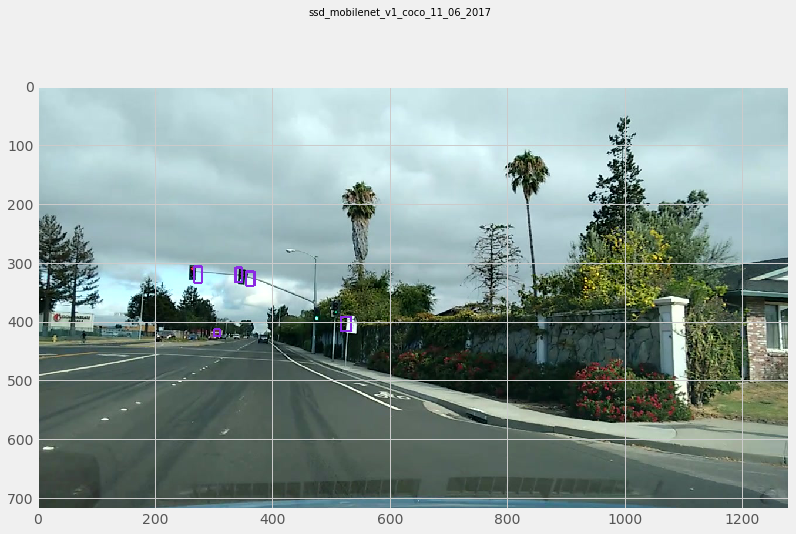

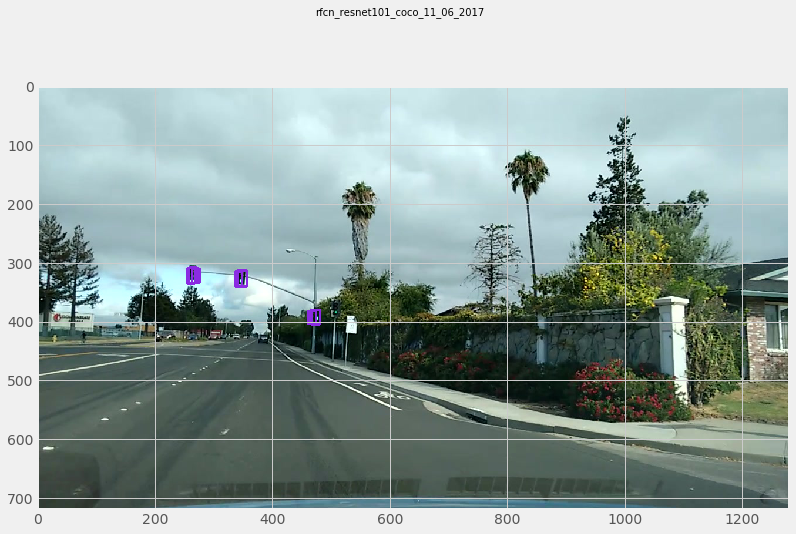

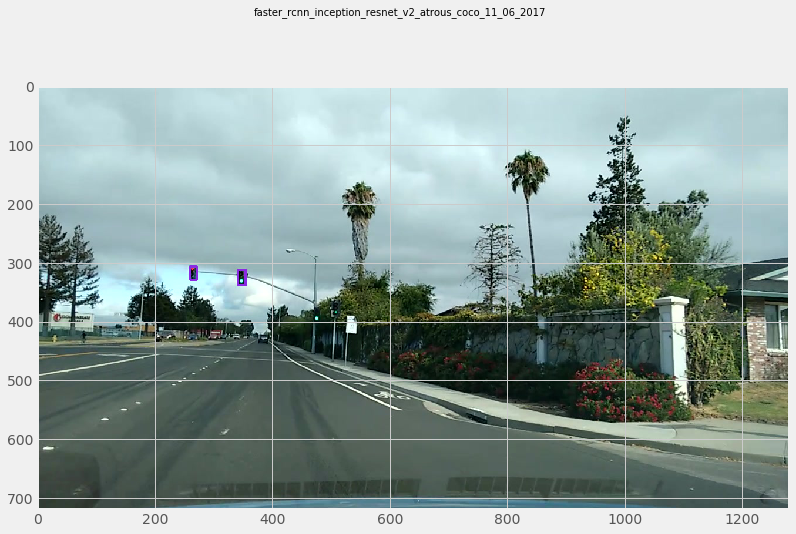

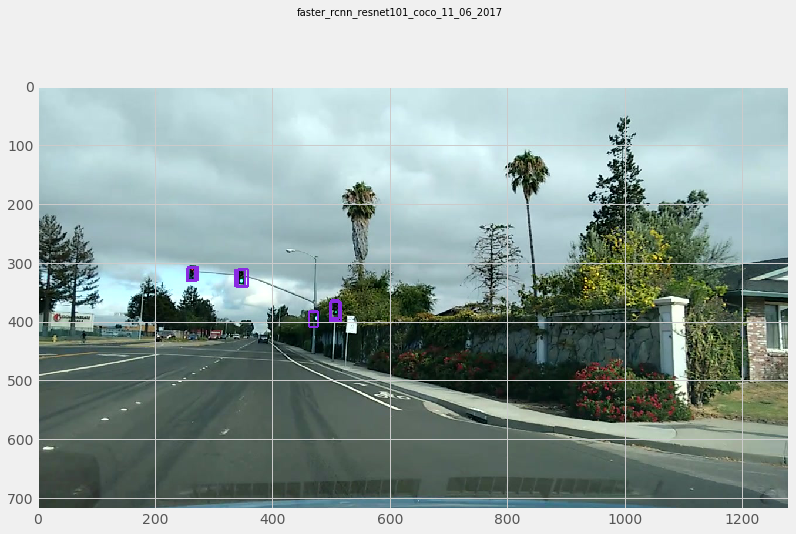

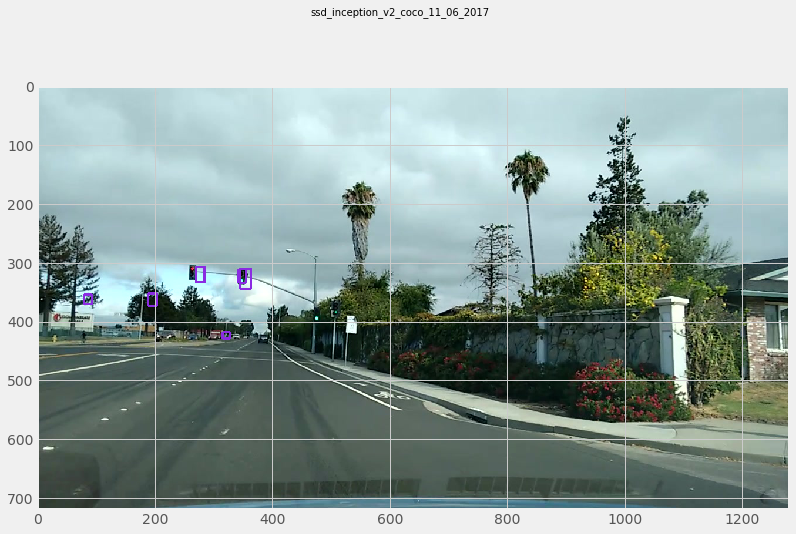

...

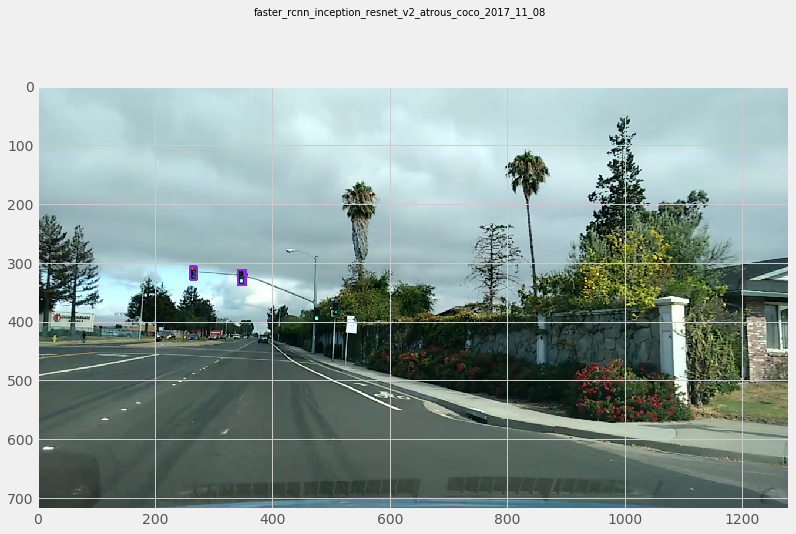

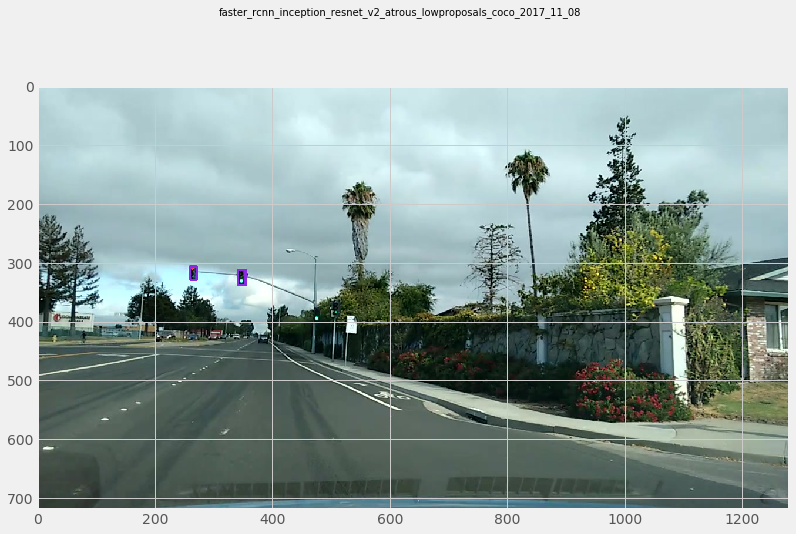

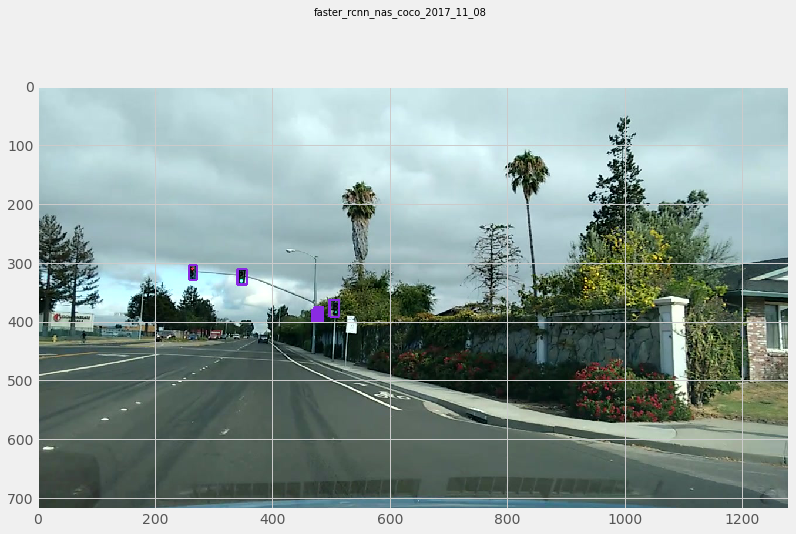

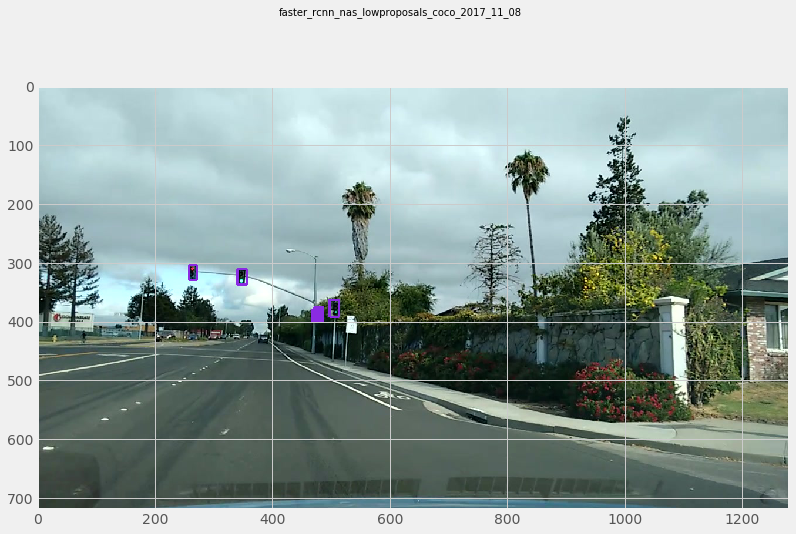

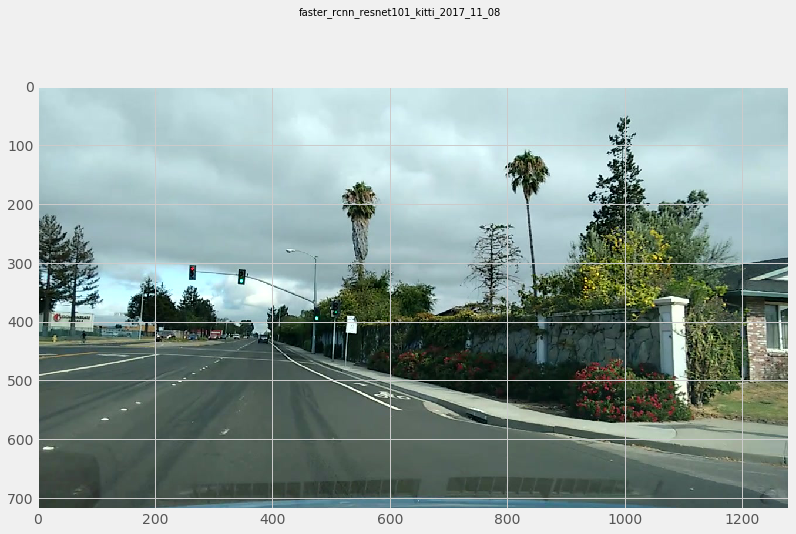

In [ ]:
for model in frozen_model_paths:
    print('testing model', model.split('/')[5])
    detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(model)
    image = Image.open(test_image)
    image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
    with tf.Session(graph=detection_graph) as sess:                
        boxes,scores,classes,_ = detect(sess,
                                  image_tensor,
                                  detection_boxes,
                                  detection_scores,
                                  detection_classes,
                                  image_np,
                                  traffic_sign_class_id)
    confidence_cutoff = 0.2
    traffic_lights_class_id=10
    # Filter boxes with a confidence score less than `confidence_cutoff`
    boxes, scores, classes = filter_boxes(confidence_cutoff, boxes, scores, classes,[traffic_lights_class_id])
    ilustrate_detection(image,boxes,classes,model.split('/')[5])

## Timing the models

In [ ]:
times_arr=[]
tick_arr=[]
print("Timing the models...")
for candidate_model in frozen_model_paths:
    detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(candidate_model)
    image = Image.open(test_image)
    image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
    _,_,_,times = detect(tf.Session(graph=detection_graph),
                                  image_tensor,
                                  detection_boxes,
                                  detection_scores,
                                  detection_classes,
                                  image_np,
                                  traffic_sign_class_id,
                                        10)
    times_arr.append(times)
    tick_arr.append(candidate_model.split('/')[5])
    print("\t=============== ", candidate_model.split('/')[5])
    print("\t", times)

print("Done timing the models.")  

Timing the models...
	===============  ssd_mobilenet_v1_coco_11_06_2017
	 [ 1235.27669907    64.01562691    51.48124695    47.34873772    49.49808121
    46.51355743    44.10552979    48.5355854     43.89333725    46.52142525]
	===============  rfcn_resnet101_coco_11_06_2017
	 [ 6903.00965309   167.76585579   168.97678375   169.52872276   167.12665558
   173.60091209   161.39578819   166.31793976   160.98761559   157.94348717]
	===============  faster_rcnn_inception_resnet_v2_atrous_coco_11_06_2017
	 [ 6207.06439018   723.84285927   712.40735054   716.1295414    712.6083374
   704.51283455   706.54249191   717.87929535   716.5927887    706.88676834]
	===============  faster_rcnn_resnet101_coco_11_06_2017
	 [ 3859.4827652    214.36357498   228.99198532   230.03411293   228.90901566
   227.32615471   222.2032547    227.57148743   233.61158371   238.43288422]
	===============  ssd_inception_v2_coco_11_06_2017
	 [ 2132.37214088    69.26703453    71.63500786    61.93709373    54.81386185
  

In [ ]:
import glob
frozen_model_paths=[graph for graph in glob.iglob(MODELS_DIR+'/**/*.pb')]
image_paths=[ graph for graph in glob.iglob('test_images_bosch/*')]
traffic_sign_class_id = 10
times_arr=[]
tick_arr=[]
print("Timing the models...")
num_runs = 5
for candidate_model in frozen_model_paths:
    detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(candidate_model)
    with tf.Session(graph=detection_graph) as sess:                
        for i in range(num_runs):
            test_image=image_paths[1]
            image = Image.open(test_image)
            image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
            _,_,_,times = detect(sess,
                              image_tensor,
                              detection_boxes,
                              detection_scores,
                              detection_classes,
                              image_np,
                              traffic_sign_class_id,
                                    1)
        times_arr.append(times)
        tick_arr.append(candidate_model.split('/')[5])
        print("\t=============== ", candidate_model.split('/')[5], test_image)
        print("\t", times)

print("Done timing the models.")  

In [ ]:
# Create a figure instance
fig = plt.figure(1, figsize=(9, 6))

# Create an axes instance
ax = fig.add_subplot(111)
plt.title("Object Detection Timings")
plt.ylabel("Time (ms)")

# Create the boxplot
plt.style.use('fivethirtyeight')
bp = ax.boxplot(times_arr)
plt.xticks(range(1,len(tick_arr)+1), tick_arr,rotation=90)

## Detecting traffic lights with Inception 

In [ ]:
inception=frozen_model_paths[4]
print(inception)
detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(inception)
sess = tf.Session(graph=detection_graph)
for test_image in image_paths[0:200:10]:    
    image = Image.open(test_image)
    image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
    boxes,scores,classes,_ = detect(sess,
                                  image_tensor,
                                  detection_boxes,
                                  detection_scores,
                                  detection_classes,
                                  image_np,
                                  traffic_sign_class_id)
    print(test_image)    
    confidence_cutoff = 0.2
    traffic_lights_class_id=10
    # Filter boxes with a confidence score less than `confidence_cutoff`
    boxes, scores, classes = filter_boxes(confidence_cutoff, boxes, scores, classes,[traffic_lights_class_id])
    ilustrate_detection(image,boxes,classes,inception.split('/')[1])
print("done")    

## Detecting traffic lights with Mobilenet

In [ ]:
mobilenet=frozen_model_paths[5]
detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(mobilenet)
sess = tf.Session(graph=detection_graph)
for test_image in image_paths[0:200:10]:    
    image = Image.open(test_image)
    image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
    boxes,scores,classes,_ = detect(sess,
                                  image_tensor,
                                  detection_boxes,
                                  detection_scores,
                                  detection_classes,
                                  image_np,
                                  traffic_sign_class_id)
    confidence_cutoff = 0.2
    traffic_lights_class_id=10
    # Filter boxes with a confidence score less than `confidence_cutoff`
    boxes, scores, classes = filter_boxes(confidence_cutoff, boxes, scores, classes,[traffic_lights_class_id])
    ilustrate_detection(image,boxes,classes,mobilenet.split('/')[1])
    print(test_image)
print("done")    